# Demo analyzing 2P data of microglia activity

In [ ]:
import cv2
try:
    cv2.setNumThreads(8)
except():
    pass

import glob
import logging
import matplotlib.pyplot as plt
import numpy as np
import os

import caiman as cm
from caiman.motion_correction import MotionCorrect
from caiman.source_extraction.cnmf import cnmf as cnmf
from caiman.source_extraction.cnmf import params as params
from caiman.utils.utils import download_demo
from caiman.utils.visualization import nb_view_patches
from skimage.util import montage
import bokeh.plotting as bpl
import holoviews as hv
bpl.output_notebook()
hv.notebook_extension('bokeh')

### Uploading and pre-viewing data
Here I used a direct path to the demo file.

**E_0002 sample metadata**
- Image size: 512x512 px
- Area size: 159x159 um
- Pixel size: 0.311 um/px
- Magnification: 20x
- NA: 1.0
- Reg. frequency: 1 Hz
- Frames number: 1500
- Ref. duration: 1634 s
- Application time: 256-628 s

## Motion correction
*if there is no existing memmap*

In [ ]:
ca_path = ["/home/wisstock/bio/scripts/microca/demo_data/E_0002_ca.tif"]

# if True - Ca channel demostration on
display_movie = True
if display_movie:
    m_orig = cm.load_movie_chain(ca_path)
    ds_ratio = 0.31
    m_orig.resize(1, 1, ds_ratio).play(
        q_max=99.5, fr=100, magnification=1)

### Parameter setting

In [ ]:
# dataset dependent parameters
fr = 1                      # imaging rate in frames per second
decay_time = 3              # length of a typical transient in seconds (see source/Getting_Started.rst)

# motion correction parameters
strides = (80, 80)          # start a new patch for pw-rigid motion correction every x pixels
overlaps = (20, 20)         # overlap between pathes (size of patch strides+overlaps)
max_shifts = (10, 10)       # maximum allowed rigid shifts (in pixels)
max_deviation_rigid = 3     # maximum shifts deviation allowed for patch with respect to rigid shifts
pw_rigid = True             # flag for performing non-rigid motion correction

# parameters for source extraction and deconvolution
p = 1                       # order of the autoregressive system
gnb = 2                     # number of global background components
merge_thr = 0.75            # merging threshold, max correlation allowed
rf =  50                    # half-size of the patches in pixels. e.g., if rf=25, patches are 50x50
stride_cnmf = None          # amount of overlap between the patches in pixels
K = 40                      # number of components per patch
method_init = 'graph_nmf'   # initialization method (if analyzing dendritic data using 'sparse_nmf')
ssub = 2                    # spatial subsampling during initialization
tsub = 2                    # temporal subsampling during intialization

opts_dict = {'fnames': ca_path,
            'fr': fr,
            'decay_time': decay_time,
            'strides': strides,
            'overlaps': overlaps,
            'max_shifts': max_shifts,
            'max_deviation_rigid': max_deviation_rigid,
            'pw_rigid': pw_rigid,
            'p': p,
            'nb': gnb,
            'rf': rf,
            'K': K, 
            'stride': stride_cnmf,
            'method_init': method_init,
            'rolling_sum': True,
            'only_init': True,
            'ssub': ssub,
            'tsub': tsub,
            'merge_thr': merge_thr}

opts = params.CNMFParams(params_dict=opts_dict)

### Motion correction

In [ ]:
# start a cluster for parallel processing (if a cluster already exists it will be closed and a new session will be opened)
if 'dview' in locals():
    cm.stop_server(dview=dview)
c, dview, n_processes = cm.cluster.setup_cluster(
    backend='local', n_processes=None, single_thread=False)

mc = MotionCorrect(ca_path, dview=dview, **opts.get_group('motion'))

mc.motion_correct(save_movie=True)
m_els = cm.load(mc.fname_tot_els)
border_to_0 = 0 if mc.border_nan == 'copy' else mc.border_to_0 

In [ ]:
# display results
display_movie = True
save_avi = False
if display_movie:
    m_orig = cm.load_movie_chain(ca_path)
    ds_ratio = 0.2
    cm.concatenate([m_orig.resize(1, 1, ds_ratio) - mc.min_mov*mc.nonneg_movie,
                    m_els.resize(1, 1, ds_ratio)], 
                   axis=2).play(fr=30, q_max=99.5, magnification=1, offset=0, save_movie=save_avi)

In [ ]:
# memory map the file in order 'C' saving
ca_new = cm.save_memmap(mc.mmap_file, base_name='memmap_', order='C',
                        border_to_0=border_to_0) # exclude borders


## CNMF calc

*if there is no existing CNMF*

In [ ]:
# if already exist, load this:
# /home/wisstock/Bio/scripts/microca/demo_data/memmap__d1_512_d2_512_d3_1_order_C_frames_1500_.mmap

Yr, dims, T = cm.load_memmap('/home/wisstock/bio/scripts/microca/demo_data/memmap_d1_512_d2_512_d3_1_order_C_frames_1500.mmap')
ca_images = np.reshape(Yr.T, [T] + list(dims), order='F') 


In [ ]:
# img preview
print(np.shape(ca_images))

plt.figure(figsize=(10, 10))
plt.imshow(np.max(ca_images, axis=0), cmap='jet')
plt.show()

### Run CNMF

#### Parameters

In [ ]:
# dataset dependent parameters
fr = 0.9                     # imaging rate in frames per second
decay_time = 3               # length of a typical transient in seconds (see source/Getting_Started.rst)

# parameters for source extraction and deconvolution
p = 2                        # order of the autoregressive system
gnb = 2                      # number of global background components
merge_thr = 0.1             # merging threshold, max correlation allowed
rf =  150                    # half-size of the patches in pixels. e.g., if rf=25, patches are 50x50
stride_cnmf = 50            # amount of overlap between the patches in pixels
K = 40                       # number of components per patch
gSig = [5, 5]              # radius of average neurons (in pixels)
method_init = 'greedy_roi'   # initialization method ('sparse_nmf' NOT WORKING!),   'graph_nmf'
seed_method = 'auto'         # methods for choosing seed pixels during greedy_roi or corr_pnr initialization
ssub = 4                     # spatial subsampling during initialization
tsub = 4                     # temporal subsampling during intialization

opts_dict = {'fr': fr,
            'decay_time': decay_time,
            'p': p,
            'nb': gnb,
            'rf': rf,
            'K': K,
            'gSig': gSig, 
            'stride': stride_cnmf,
            'method_init': method_init,
            'seed_method': seed_method,
            'rolling_sum': True,
            'only_init': False,
            'ssub': ssub,
            'tsub': tsub,
            'merge_thr': merge_thr,
            'use_cnn': False}

opts = params.CNMFParams(params_dict=opts_dict)
# opts.to_dict()

In [ ]:
# IF WE LOAD EXISTING MEMMAP
# start a cluster for parallel processing (if a cluster already exists it will be closed and a new session will be opened)
if 'dview' in locals():
    cm.stop_server(dview=dview)
c, dview, n_processes = cm.cluster.setup_cluster(backend='local',
                                                 n_processes=None,
                                                 single_thread=False)

# IF WE CREATE NEW MEMMAP
# restart cluster to clean up memory
# cm.stop_server(dview=dview)
# c, dview, n_processes = cm.cluster.setup_cluster(backend='local',
#                                                  n_processes=None,
#                                                  single_thread=False)

In [ ]:
cnm = cnmf.CNMF(n_processes, params=opts, dview=dview)
cnm = cnm.fit(ca_images)

save_results = False
if save_results:
    cnm.save('/home/wisstock/bio/scripts/microca/demo_data/demo_cnm_results_fit.hdf5')

In [ ]:
# contours plot
Cn = cm.local_correlations(ca_images, swap_dim=False)
Cn[np.isnan(Cn)] = 0
cnm.estimates.plot_contours(img=Cn)

In [ ]:
#%% restart cluster to clean up memory
cm.stop_server(dview=dview)
c, dview, n_processes = cm.cluster.setup_cluster(
    backend='local', n_processes=None, single_thread=False)

## CNMF analysis

#### Load memmap

Decode mmap filename /home/wisstock/bio/scripts/microca/demo_data/memmap_d1_512_d2_512_d3_1_order_C_frames_1500.mmap


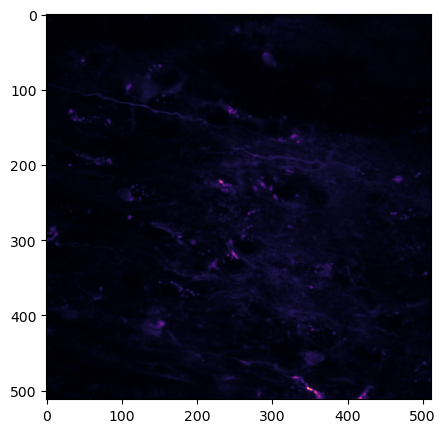

In [4]:
Yr, dims, T = cm.load_memmap('/home/wisstock/bio/scripts/microca/demo_data/memmap_d1_512_d2_512_d3_1_order_C_frames_1500.mmap')
ca_images = np.reshape(Yr.T, [T] + list(dims), order='F') 

plt.figure(figsize=(5, 5))
plt.imshow(np.mean(ca_images, axis=0), cmap='magma')
plt.show()

#### Load .hdf5 file

In [5]:
# IF WE LOAD EXISTING .hdf5
# start a cluster for parallel processing (if a cluster already exists it will be closed and a new session will be opened)
if 'dview' in locals():
    cm.stop_server(dview=dview)
c, dview, n_processes = cm.cluster.setup_cluster(backend='local',
                                                 n_processes=None,
                                                 single_thread=False)

# IF WE CREATE NEW .hdf5
# restart cluster to clean up memory
# cm.stop_server(dview=dview)
# c, dview, n_processes = cm.cluster.setup_cluster(backend='local',
#                                                  n_processes=None,
#                                                  single_thread=False)

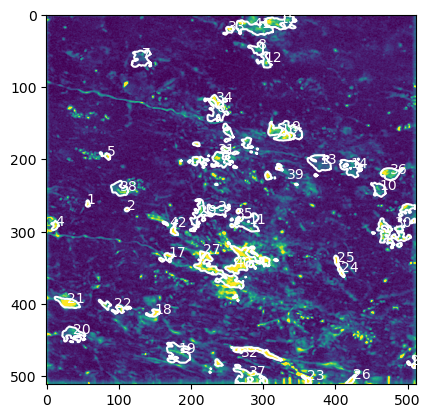

In [6]:
cnm = cnmf.load_CNMF('/home/wisstock/bio/scripts/microca/demo_data/demo_cnm_results_fit.hdf5', n_processes=1, dview=dview)

# contours plot
Cn = cm.local_correlations(ca_images, swap_dim=False)
Cn[np.isnan(Cn)] = 0
cnm.estimates.plot_contours(img=Cn)

#### Parameters

In [7]:
# parameters for component evaluation, spatial and qualuty
min_SNR = 10.0               # signal to noise ratio for accepting a component
rval_thr = 0.9              # space correlation threshold for accepting a component
extract_cc = False          # extract connected components during thresholding (might want to turn to False for dendritic imaging)

cnm.params.set('quality', {'min_SNR': min_SNR,
                           'rval_thr': rval_thr,
                           'extract_cc': extract_cc})

cnm.estimates.evaluate_components(ca_images, cnm.params, dview=dview)
cnm.estimates.plot_contours_nb(img=Cn, idx=cnm.estimates.idx_components)

Decode mmap filename /home/wisstock/bio/scripts/microca/demo_data/memmap_d1_512_d2_512_d3_1_order_C_frames_1500.mmap


In [8]:
cnm.estimates.threshold_spatial_components(maxthr=0.3, dview=dview)
cnm.estimates.remove_small_large_neurons(min_size_neuro=100, max_size_neuro=10e4)
cnm.estimates.plot_contours_nb(img=Cn, idx=cnm.estimates.idx_components)

print(f'{len(cnm.estimates.idx_components)} good components: {cnm.estimates.idx_components}')
print(f'{len(cnm.estimates.idx_components_bad)} bad components: {cnm.estimates.idx_components_bad}')

17 good components: [ 2  6  7  8  9 10 14 15 19 20 30 31 33 36 37 39 40]
25 bad components: [ 0  1  3  4  5 11 12 13 16 17 18 21 22 23 24 25 26 27 28 29 32 34 35 38
 41]


#### Good components plot

In [ ]:
# cnm.estimates.select_components(use_object=True)
cnm.estimates.nb_view_components(img=Cn, idx=cnm.estimates.idx_components, cmap='spring', denoised_color='red')

In [9]:
cnm.estimates.play_movie(ca_images, q_max=99.9, magnification=1, include_bck=False, use_color=True, save_movie=True)

: 

: 

#### Bad components plot

In [ ]:
cnm.estimates.nb_view_components(img=np.max(ca_images, axis=0),
                                 idx=cnm.estimates.idx_components_bad,
                                 cmap='spring', denoised_color='red')